# Cleaning TV Commercial Data

Here, I started with a dataset downloaded from the UCI Machine Learning Repository: [TV Commercial Detection Dataset](http://archive.ics.uci.edu/ml/datasets/tv+news+channel+commercial+detection+dataset) and attempted to convert it into a more general user friendly format. I will then use the data to make some predictions about whether we are looking at a TV commercial or not.

Note, this exercise is intended to be more about manipulating the data than machine learning.

### Load libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.datasets import load_svmlight_file
import plotly.express as ex
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score as f1
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import scikitplot as skplt

/anaconda3/lib/python3.7/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


### Read in the data

The README file can be found in the directory containing the data. The format is Lib SVM data, which is new for me. A quick Google points me to sklearn.datasets.load_svmlight_file, so I will try that. This loads it into a sparse CSR matrix. So I'll be reading in a file from a format I have never seen before into another format that I've never seen before! I will then need to understand the format of the sparse CSR matrix.

In [2]:
data = load_svmlight_file('../../data/TV_News_Channel_Commercial_Detection_Dataset/BBC.txt')

In [3]:
X, y = data[0], data[1]
print(X.shape)
print(y.shape)

(17720, 4125)
(17720,)


OK, 4125 matches the number of columns in the README. I will turn this into a dataframe. Here, X are the features and y are the target values: commercial (1) on not (-1).

In [4]:
df = pd.DataFrame(X.toarray())
df.head()

,0,1,2,3,4,5,6,7,8,9,...,4115,4116,4117,4118,4119,4120,4121,4122,4123,4124
0,123.0,1.316440,1.516003,5.605905,5.346760,0.013233,0.010729,0.091743,0.050768,3808.067871,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.422334,0.663918
1,124.0,0.966079,0.546420,4.046537,3.190973,0.008338,0.011490,0.075504,0.065841,3466.266113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.332664,0.766184
2,109.0,2.035407,0.571643,9.551406,5.803685,0.015189,0.014294,0.094209,0.044991,3798.196533,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346674,0.225022
3,86.0,3.206008,0.786326,10.092709,2.693058,0.013962,0.011039,0.092042,0.043756,3761.712402,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.993323,0.840083
4,76.0,3.135861,0.896346,10.348035,2.651010,0.020914,0.012061,0.108018,0.052617,3784.488037,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.341520,0.710470


In [5]:
df.shape

(17720, 4125)

This is in a more familiar format. I will now create better column names using informatiom from the README file.

In [6]:
column_names = ['Shot Length', 'Mean MD', 'Var MD', 'Mean FDD', 'Var FDD', 'Mean STE', 'Var STE', 'Mean ZCR', 'Var ZCR', 'Mean SC', 'Var SC', 'Mean SRO', 'Var SRO', 'Mean SF', 'Var SF', 'Mean FF', 'Var FF']
print(len(column_names))

17


Where we have

- Motion Distribution = MD
- Frame Difference Distribution = FDD
- Short time energy = STE
- ZCR = ZCR
- Spectral Centroid = SC
- Spectral Roll off = SRO
- Spectral Flux = SF
- Fundamental Frequency = FF

And in the following, we also have

- Text area distribution = TAD
- Bag of Audio Words = BAW
- Edge change Ratio = ECR

In [7]:
for i in range(40):
    column_names.append('MD bin %i' %(i+1))
print(len(column_names))
for i in range(32):
    column_names.append('FDD bin %i' %(i+1))
print(len(column_names))
for i in range(15):
    column_names.append('Mean TAD bin %i' %(i+1))
for i in range(15):
    column_names.append('Var TAD bin %i' %(i+1))
print(len(column_names))
for i in range(4000):
    column_names.append('BAW bin %i' %(i+1))
    
column_names.append('Mean ECR')
column_names.append('Var ECR')

print(len(column_names))

57
89
119
4121


OK, there appears to be a mistake for the number of bins in the README. For example, it states that the MD bins take up columns [18-58] but says there are only 40 bins. This creates a further problem for the Mean and Var TADs, as there may be one extra column for either the mean or the variance.

One thing I considered to try and remedy this was to look at the means and variances for MD and match them to the means and variances of the binned data. However, this didn't seem to work, as there was a big mismatch that I don't understand as yet. I then looked at the data myself to see if I could spot changes in the behaviour of the data. The first thing I spotted is that the means and variances of the TAD don't appear to match the column numbers.

In [8]:
df.iloc[0:5, 87:121] # Here the column indices start at 0, not 1 as in the README and the above cell.

,87,88,89,90,91,92,93,94,95,96,...,111,112,113,114,115,116,117,118,119,120
0,0.0,0.0,0.020584,0.185038,0.148316,0.047098,0.169797,0.061318,0.002200,0.010440,...,0.056323,0.024587,0.0,0.037647,0.006015,0.160327,0.251688,0.176144,0.0,0.0
1,0.0,0.0,0.014988,0.153249,0.133742,0.009925,0.159803,0.001562,0.009279,0.026443,...,0.082039,0.018582,0.0,0.011161,0.000000,0.193530,0.206926,0.051774,0.0,0.0
2,0.0,0.0,0.000000,0.000000,0.083693,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.145836,0.185767,0.038852,0.0,0.0
3,0.0,0.0,0.000000,0.000000,0.073417,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.114123,0.165600,0.003983,0.0,0.0
4,0.0,0.0,0.000000,0.000000,0.080344,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.117717,0.159495,0.000066,0.0,0.0


Instead, it seems that they actually belong to columns [90-119] (here labelling the first column as 1, as in the README), since either side of this range are columns of zeros. This gives 30 bins: 15 for the means and 15 for the variances. If these are the Mean TAD and Var TAD bins, then everything up to and including these have the correct bin numbers.

The only thing that is left are the BAW bins and the mean and variance of ECR. Again, looking at the data, it appears that most of the BAW bins are zeros.

In [9]:
df.iloc[:5, 119:] # column indices start at zero here, not 1 as in the README and the above cell.

,119,120,121,122,123,124,125,126,127,128,...,4115,4116,4117,4118,4119,4120,4121,4122,4123,4124
0,0.0,0.0,0.0,0.006356,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.422334,0.663918
1,0.0,0.0,0.0,0.002101,0.0,0.0,0.0,0.0,0.0,0.008403,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.332664,0.766184
2,0.0,0.0,0.0,0.016827,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346674,0.225022
3,0.0,0.0,0.0,0.024691,0.0,0.0,0.0,0.0,0.0,0.003086,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.993323,0.840083
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.341520,0.710470


The last two columns are non-zeros and look very different to the rest. It seems that these must be the mean and variance of ECR. With this in mind the remaining columns will be labelled as the BAW bins. However, this gives 4004 bins, not 4000 as in the README. With there being four additional bins, it seems logical that these would be either at the start [120-123] or end [4119-4122] of the remaining cells. Looking at these columns, we see that column 123 has non-zero data, we therefore believe that either there are 4004 bins or the columns 4120-4123 are surplus. Either way, these contain no-nonzero information. We label these as additional BAW bins, but it should be kept in mind that they may be surplus.

In [10]:
column_names = ['Shot Length', 'Mean MD', 'Var MD', 'Mean FDD', 'Var FDD', 'Mean STE', 'Var STE', 'Mean ZCR', 'Var ZCR', 'Mean SC', 'Var SC', 'Mean SRO', 'Var SRO', 'Mean SF', 'Var SF', 'Mean FF', 'Var FF']

for i in range(40):
    column_names.append('MD bin %i' %(i+1))
for i in range(32):
    column_names.append('FDD bin %i' %(i+1))
for i in range(15):
    column_names.append('Mean TAD bin %i' %(i+1))
for i in range(15):
    column_names.append('Var TAD bin %i' %(i+1))
for i in range(4004):
    column_names.append('BAW bin %i' %(i+1))
    
column_names.append('Mean ECR')
column_names.append('Var ECR')

print(len(column_names))

df.columns = column_names
df.head()

4125


,Shot Length,Mean MD,Var MD,Mean FDD,Var FDD,Mean STE,Var STE,Mean ZCR,Var ZCR,Mean SC,...,BAW bin 3997,BAW bin 3998,BAW bin 3999,BAW bin 4000,BAW bin 4001,BAW bin 4002,BAW bin 4003,BAW bin 4004,Mean ECR,Var ECR
0,123.0,1.316440,1.516003,5.605905,5.346760,0.013233,0.010729,0.091743,0.050768,3808.067871,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.422334,0.663918
1,124.0,0.966079,0.546420,4.046537,3.190973,0.008338,0.011490,0.075504,0.065841,3466.266113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.332664,0.766184
2,109.0,2.035407,0.571643,9.551406,5.803685,0.015189,0.014294,0.094209,0.044991,3798.196533,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346674,0.225022
3,86.0,3.206008,0.786326,10.092709,2.693058,0.013962,0.011039,0.092042,0.043756,3761.712402,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.993323,0.840083
4,76.0,3.135861,0.896346,10.348035,2.651010,0.020914,0.012061,0.108018,0.052617,3784.488037,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.341520,0.710470


next we add the target column

In [11]:
df.insert(0, 'Target', y)
df.head()

,Target,Shot Length,Mean MD,Var MD,Mean FDD,Var FDD,Mean STE,Var STE,Mean ZCR,Var ZCR,...,BAW bin 3997,BAW bin 3998,BAW bin 3999,BAW bin 4000,BAW bin 4001,BAW bin 4002,BAW bin 4003,BAW bin 4004,Mean ECR,Var ECR
0,1.0,123.0,1.316440,1.516003,5.605905,5.346760,0.013233,0.010729,0.091743,0.050768,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.422334,0.663918
1,1.0,124.0,0.966079,0.546420,4.046537,3.190973,0.008338,0.011490,0.075504,0.065841,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.332664,0.766184
2,1.0,109.0,2.035407,0.571643,9.551406,5.803685,0.015189,0.014294,0.094209,0.044991,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346674,0.225022
3,1.0,86.0,3.206008,0.786326,10.092709,2.693058,0.013962,0.011039,0.092042,0.043756,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.993323,0.840083
4,1.0,76.0,3.135861,0.896346,10.348035,2.651010,0.020914,0.012061,0.108018,0.052617,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.341520,0.710470


In [12]:
df['Target'].unique()

array([ 1., -1.])

I will set the -1 to 0 to be more consistent with normal practice

In [13]:
df['Target'].replace({-1:0}, inplace=True)
df['Target'].unique()

array([1., 0.])

In [14]:
# df.to_csv('../../cleaned_data/BBC.csv') I am not writing this, as it is too large to send to GitHub and probably quicker to create than read in!

### Looking at the data

In [15]:
ex.pie(df,names='Target',title='Commercial or not')

Great, the two classifications seem reasonably equally represented

In [16]:
def box_and_hist(feat):

    fig = make_subplots(rows=2, cols=1)

    tr1=go.Box(x=df[feat],name=feat + ' Box Plot',boxmean=True)
    tr2=go.Histogram(x=df[feat],name=feat + ' Histogram')

    fig.add_trace(tr1,row=1,col=1)
    fig.add_trace(tr2,row=2,col=1)

    fig.update_layout(height=700, width=1200, title_text=feat)
    fig.show()

In [17]:
box_and_hist('Shot Length')

Here we see a very non-Normal distribution, with large outliers. I would guess that the outliers are correlated with non-commercial targets, so this may be usefull information.

I will now create similar plots for the rest of the mean data.

In [18]:
box_and_hist('Mean MD')

In [19]:
box_and_hist('Mean FDD')

In [20]:
box_and_hist('Mean STE')

In [21]:
box_and_hist('Mean ZCR')

In [22]:
box_and_hist('Mean SC')

In [23]:
box_and_hist('Mean SRO')

In [24]:
box_and_hist('Mean SF')

In [25]:
box_and_hist('Mean FF')

OK, so that is all the distributions of the means. In each case, there appears to be a bunch of zeros in the data.

Lets look at correlations in the variables, droppoing the BAW columns for now.

In [26]:
df_cut = df.drop(df.filter(regex='BAW').columns, axis=1)

In [27]:
corr = df_cut.corr('pearson')

In [28]:
cut_correlation = 0.2
df_corr = df_cut[corr['Target'][corr['Target'].abs()>cut_correlation].index]
df_corr.head()

,Target,Var FDD,Mean STE,Var SC,Var SRO,Var FF,Mean TAD bin 15,Var TAD bin 14
0,1.0,5.346760,0.013233,702.992493,1390.499268,45.018257,0.189997,0.251688
1,1.0,3.190973,0.008338,904.122925,1391.858643,47.206207,0.101915,0.206926
2,1.0,5.803685,0.015189,745.916321,1466.404785,51.343670,0.036205,0.185767
3,1.0,2.693058,0.013962,840.047485,1639.901367,50.244751,0.000584,0.165600
4,1.0,2.651010,0.020914,892.398682,1726.300415,50.382572,0.000008,0.159495


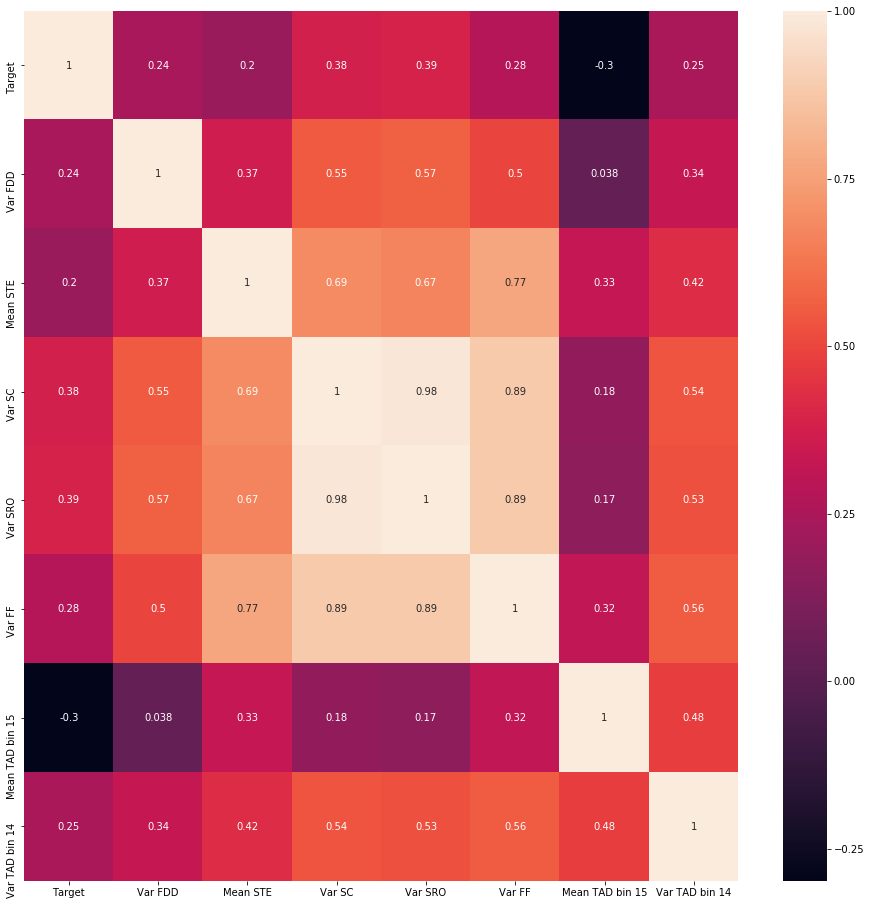

In [29]:
plt.figure(figsize=(16,16))
sns.heatmap(df_corr.corr('pearson'),annot=True)

I will try using these variables with a decision tree as a starting point.

### Fitting a model

In [30]:
test_size = 0.02 # Andrew Ng suggests using the majority of data for training and saving a couple of hundred for tests.

X_train, X_test, y_train, y_test = train_test_split(df_corr.drop('Target', 1), df_corr['Target'], test_size = test_size, random_state=10)

print(len(y_test))

355


In [31]:
clf = DecisionTreeClassifier()

In [32]:
model = clf.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
confusion_matrix(y_train, y_train_pred)

array([[9103,    0],
       [1151, 7111]])

In [33]:
y_pred = model.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[175,  26],
       [ 59,  95]])

In [34]:
f1_train = cross_val_score(model ,X_train, y_train, cv=5, scoring='f1')

print('F1 train score = ', np.mean(f1_train))
print('F1 test score = ', f1(y_pred, y_test))
print('Accuaracy test score = ', accuracy_score(y_pred, y_test))

F1 train score =  0.7503220042547356
F1 test score =  0.690909090909091
Accuaracy test score =  0.7605633802816901


Let's try Random Forests...

In [35]:
model_rf = RandomForestClassifier().fit(X_train, y_train)
y_train_pred_rf = model_rf.predict(X_train)
confusion_matrix(y_train, y_train_pred_rf)

array([[9103,    0],
       [1151, 7111]])

This seems to be the same as for a decision tree!

In [36]:
y_pred_rf = model_rf.predict(X_test)
confusion_matrix(y_test, y_pred_rf)

array([[175,  26],
       [ 37, 117]])

In [37]:
f1_train = cross_val_score(model_rf ,X_train, y_train, cv=5, scoring='f1')

print('F1 train score = ', np.mean(f1_train))
print('F1 test score = ', f1(y_pred_rf, y_test))
print('Accuaracy test score = ', accuracy_score(y_pred_rf, y_test))

F1 train score =  0.8074663168218017
F1 test score =  0.787878787878788
Accuaracy test score =  0.8225352112676056


With slightly better F1 score for the test data

Finally, I will try a SVC...

In [38]:
model_svc = SVC().fit(X_train, y_train)

In [39]:
y_train_pred_svc = model_svc.predict(X_train)
confusion_matrix(y_train, y_train_pred_svc)

array([[7109, 1994],
       [3018, 5244]])

In [40]:
y_pred_svc = model_svc.predict(X_test)
confusion_matrix(y_test, y_pred_svc)

array([[158,  43],
       [ 64,  90]])

In [41]:
f1_train = cross_val_score(model_svc ,X_train, y_train, cv=5, scoring='f1')

print('F1 train score = ', np.mean(f1_train))
print('F1 test score = ', f1(y_pred_svc, y_test))
print('Accuaracy test score = ', accuracy_score(y_pred_svc, y_test))

F1 train score =  0.6769602445257774
F1 test score =  0.627177700348432
Accuaracy test score =  0.6985915492957746


This has done slightly worse than both the decsion tree and random forests.

With data excluding the BAW, for which there is a paper linked in the README: [Commercial Block Detection in Broadcast News Videos](https://www.researchgate.net/publication/300663545_Commercial_Block_Detection_in_Broadcast_News_Videos), it appears we do best in terms of the F1 score and accuracy using a random forest out of the three methods tried.

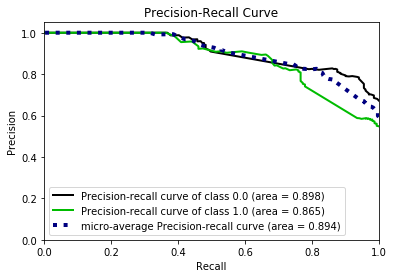

In [42]:
rf_test = model_rf.predict_proba(X_test)
skplt.metrics.plot_precision_recall(y_test, rf_test)

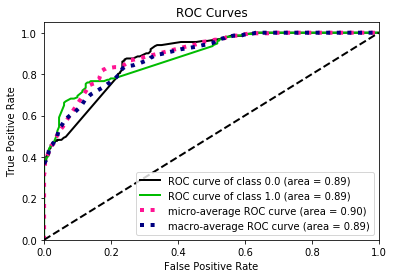

In [43]:
skplt.metrics.plot_roc(y_test, rf_test)

These AUC scores appear to indicate that the random forests classifier is providing a good description of the data, and we are achieving an accuracy of ~80% without using the BAW data. 

### Conclusion

With the random forest classifier, we can achieve a reasonably good accuracy (~80%) and F1 score (~80%) when using a dataset not containing the BAWs. The AUC for the precision-recall curve and ROC also indicate that the model is sound.

In [Commercial Block Detection in Broadcast News Videos](https://www.researchgate.net/publication/300663545_Commercial_Block_Detection_in_Broadcast_News_Videos), BAW are included in a SVC and achieve a F1 score of 97%. Since this exercise was more about data cleaning (i.e. starting with the Lib SVM data and converting it into the more convenient - from my perspective - dataframe), this will not be repeated here.